In [1]:
import cv2 as cv
from scene_info import *    
from evaluation import compare_poses
from matching import draw_matches
import pydegensac

def find_correspondences(img1, kps1, descs1, img2, kps2, descs2):

    crossCheck = False    
    matcher = cv.BFMatcher(crossCheck=crossCheck)

    assert descs1 is not None and len(descs1) != 0
    assert descs2 is not None and len(descs2) != 0

    #tentative_matches = get_cross_checked_tentatives(matcher, descs1, descs2, ratio_thresh)

    knn_matches = matcher.knnMatch(descs1, descs2, k=2)
    matches2 = matcher.match(descs2, descs1)
    tentative_matches = []
    for m, n in knn_matches:
        if matches2[m.trainIdx].trainIdx != m.queryIdx:
            continue
        ratio_thresh=0.85
        if m.distance < ratio_thresh * n.distance:
            tentative_matches.append(m)

    return tentative_matches


def split_points(tentative_matches, kps1, kps2):
    src_pts = np.float32([kps1[m.queryIdx].pt for m in tentative_matches]).reshape(-1, 2)
    dst_pts = np.float32([kps2[m.trainIdx].pt for m in tentative_matches]).reshape(-1, 2)
    return src_pts, dst_pts
    

Loading weights for net_encoder
Loading weights for net_decoder


In [2]:
def match(img_name1, img_name2, iterations, degensac=True, precise=True, show=True):
    
    errors_R = []

    for i in range(iterations):     

        scene = SceneInfo.read_scene("scene1")

        K1 = scene.get_img_K(img_name1)
        K2 = scene.get_img_K(img_name2)

        img_file_path1 = 'original_dataset/scene1/images/{}.jpg'.format(img_name1)
        img_file_path2 = 'original_dataset/scene1/images/{}.jpg'.format(img_name2)

        img1 = cv.imread(img_file_path1, None)
        img2 = cv.imread(img_file_path2, None)

        kps1, descs1 = cv.SIFT_create().detectAndCompute(img1, None)
        kps2, descs2 = cv.SIFT_create().detectAndCompute(img2, None)

        tentative_matches = find_correspondences(img1, kps1, descs1, img2, kps2, descs2)
        src_pts, dst_pts = split_points(tentative_matches, kps1, kps2)

        if precise:
            conf=0.9999
            max_iters=100000
        else:
            conf=0.999
            max_iters=2000
        
        if degensac:
        
            F, inlier_mask = pydegensac.findFundamentalMatrix(src_pts, 
                                                              dst_pts, 
                                                              px_th=0.5, 
                                                              conf=conf, 
                                                              max_iters = max_iters,
                                                              enable_degeneracy_check=True)
            inlier_mask = np.expand_dims(inlier_mask, axis=1)
        else:
            F, inlier_mask = cv.findFundamentalMat(src_pts, 
                                                   dst_pts, 
                                                   method=cv.USAC_MAGSAC, 
                                                   ransacReprojThreshold=0.5, 
                                                   confidence=conf, 
                                                   maxIters=max_iters)
        
        
            

        img_matches = draw_matches(kps1, kps2, tentative_matches, None, inlier_mask, img1, img2)
        if show:
            plt.figure(figsize=(9, 9))
            inliers_count = np.sum(inlier_mask)
            method = "degensac " if degensac else "ransac "
            title = "{} conf={}, max_iters={}: {} inliers".format(method, conf, max_iters, inliers_count)
            plt.title(title)
            plt.imshow(img_matches)
            plt.show(block=False)


        src_pts_inliers = src_pts[inlier_mask[:, 0] == [1]]
        dst_pts_inliers = dst_pts[inlier_mask[:, 0] == [1]]

        E = K2.T @ F @ K1
        
        print("F:\n {}".format(F))
        print("E:\n {}".format(E))

        img_pair = ImagePairEntry(img_name1, img_name2, 0)
        error_R, error_T = compare_poses(E, img_pair, scene, src_pts_inliers, dst_pts_inliers)
        errors_R.append(error_R)
        
    sorted_errs = list(map(lambda x: str(x), sorted(errors_R)))
    print("All relative rotation errors: {}".format(",\n".join(sorted_errs)))


scene=scene1


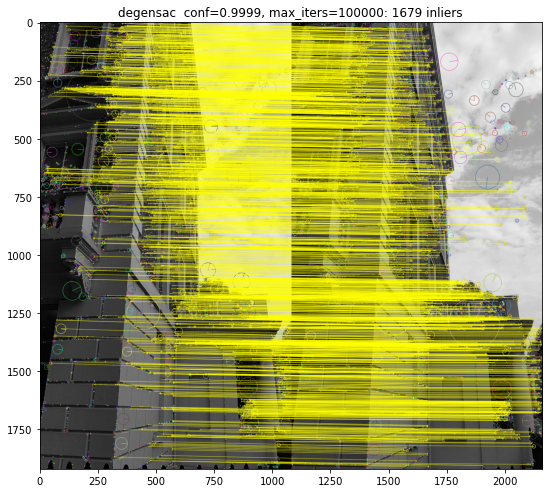

F:
 [[ 1.53453794e-06 -5.54370812e-05  3.83664341e-02]
 [ 5.02991830e-05  8.69166645e-06 -1.01284688e+00]
 [-6.42317316e-02  1.00000000e+00  3.60819689e+01]]
E:
 [[    3.56480457  -128.7829747    -21.38906585]
 [  116.84739288    20.1911543  -1490.56279833]
 [  -23.02433507  1490.30124488    15.5759267 ]]
from E recovered R: 
 [[ 0.99954894  0.02900081 -0.00780176]
 [-0.02891486  0.99952231  0.01091273]
 [ 0.00811451 -0.01068222  0.99991002]]
errors (R, T): (0.004826878176808458, 0.18979025627066629)
scene=scene1


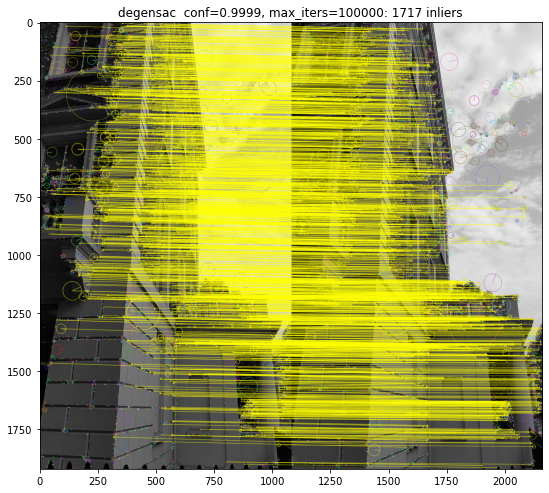

F:
 [[ 3.01223591e-06 -1.09572068e-04  9.28135317e-02]
 [ 1.02771553e-04  1.10922270e-05 -1.01718308e+00]
 [-1.17952245e-01  1.00000000e+00  3.73932860e+01]]
E:
 [[    6.9975672   -254.54112141   -16.39358474]
 [  238.74320263    25.76777063 -1450.44693198]
 [  -26.90707047  1449.28424455    14.89819865]]
from E recovered R: 
 [[ 0.99954166  0.02839913 -0.01048643]
 [-0.02827588  0.99953145  0.0117202 ]
 [ 0.01081436 -0.01141832  0.99987633]]
errors (R, T): (0.007602276014666704, 0.16004648611072858)
scene=scene1


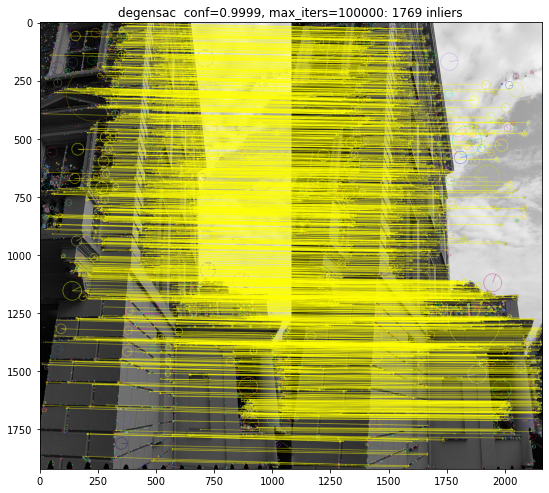

F:
 [[-5.24556859e-06  1.86665211e-04 -1.75999138e-01]
 [-1.93767376e-04  1.98011968e-06 -9.96912750e-01]
 [ 1.60564135e-01  1.00000000e+00  2.62653334e+01]]
E:
 [[-1.21857052e+01  4.33632158e+02  5.59501769e-01]
 [-4.50130825e+02  4.59991214e+00 -1.67709244e+03]
 [-4.30836616e+01  1.67962181e+03  1.75077000e+01]]
from E recovered R: 
 [[ 0.99956043  0.02812208 -0.00938598]
 [-0.02802465  0.99955359  0.01035547]
 [ 0.00967301 -0.01008788  0.99990233]]
errors (R, T): (0.0065448635205548385, 0.4596014222112758)
scene=scene1


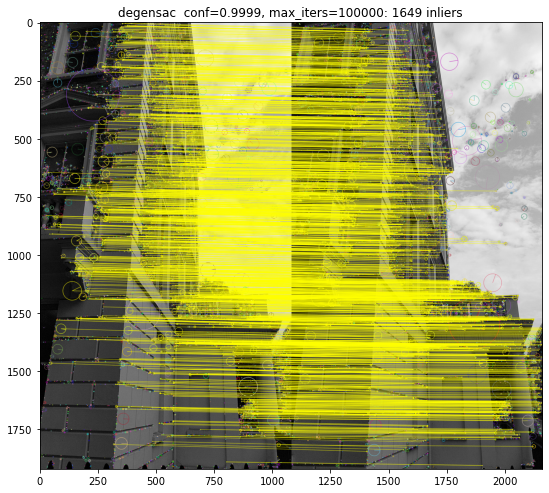

F:
 [[-2.74314010e-06  1.04892325e-04 -8.73763888e-02]
 [-1.16134490e-04  6.24540905e-06 -1.00364875e+00]
 [ 7.39028981e-02  1.00000000e+00  2.84055809e+01]]
E:
 [[   -6.37244484   243.66985583    18.055815  ]
 [ -269.78593959    14.50838209 -1617.18506432]
 [  -59.50723687  1618.59873437    16.75502481]]
from E recovered R: 
 [[ 0.99951426  0.02705333 -0.01547155]
 [-0.02687213  0.9995692   0.0118024 ]
 [ 0.01578418 -0.01138092  0.99981065]]
errors (R, T): (0.012728950957449399, 0.3594222207488119)
scene=scene1


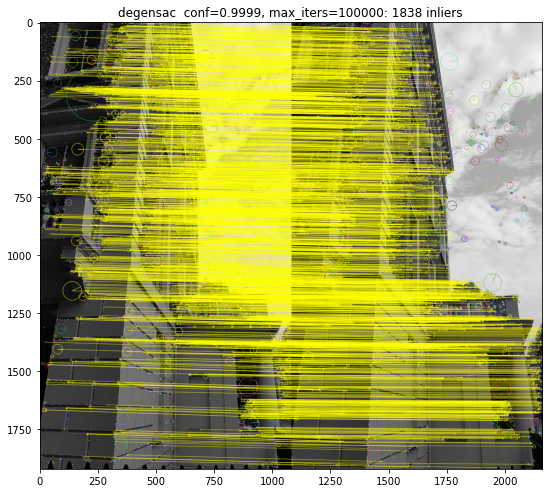

F:
 [[ 5.80544815e-06 -2.01411163e-04  2.59207537e-01]
 [ 1.98773671e-04  1.19021998e-05 -1.02516413e+00]
 [-2.91520081e-01  1.00000000e+00  4.53409757e+01]]
E:
 [[   13.48633201  -467.8877058    105.21461665]
 [  461.76068563    27.64937587 -1382.36913313]
 [ -148.60609531  1374.9289056     15.02929379]]
from E recovered R: 
 [[ 0.78217015  0.15796133  0.60270894]
 [ 0.1702036  -0.98470671  0.03719442]
 [ 0.59936682  0.07349086 -0.79709379]]
errors (R, T): (3.1409094964235127, 0.16162258012149858)
scene=scene1


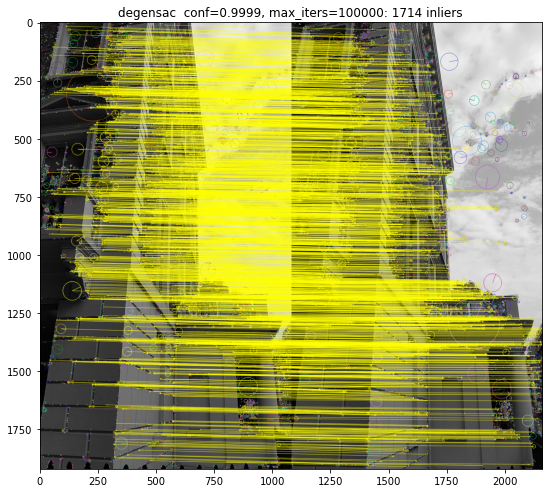

F:
 [[-3.72625665e-06  1.44235508e-04 -1.00720927e-01]
 [-1.52463178e-04  5.22462074e-06 -1.00394263e+00]
 [ 8.51014482e-02  1.00000000e+00  3.01749276e+01]]
E:
 [[   -8.65627131   335.06593994    54.49708531]
 [ -354.17920925    12.13704231 -1649.04683885]
 [  -96.38042784  1649.46673113    17.41869727]]
from E recovered R: 
 [[ 0.91254712  0.08877306 -0.39922062]
 [ 0.08624175 -0.99597692 -0.02433805]
 [-0.39977508 -0.01221986 -0.91653181]]
errors (R, T): (3.1401883969396276, 0.3997739491254078)
scene=scene1


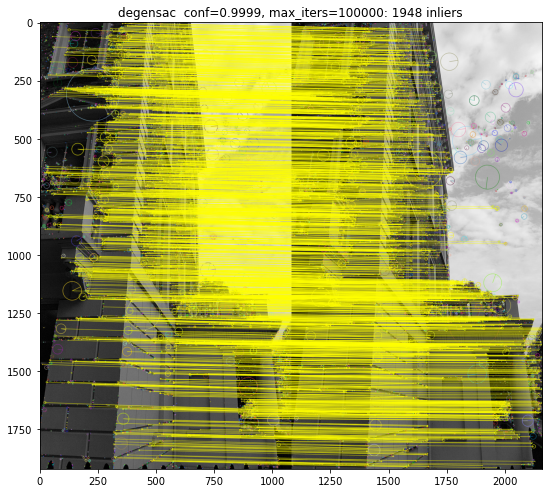

F:
 [[ 4.52982218e-06 -1.47591693e-04  2.14408063e-01]
 [ 1.43613877e-04  1.12073821e-05 -1.02209067e+00]
 [-2.44855877e-01  1.00000000e+00  4.36194617e+01]]
E:
 [[   10.52299224  -342.86251897   114.63738555]
 [  333.6218629     26.03528133 -1424.12668729]
 [ -159.2349689   1418.18063013    15.55812051]]
from E recovered R: 
 [[ 0.99956455  0.02904247 -0.0052197 ]
 [-0.02898382  0.99951956  0.01098135]
 [ 0.00553612 -0.01082528  0.99992608]]
errors (R, T): (0.0022564100424838046, 0.08762296909872774)
scene=scene1


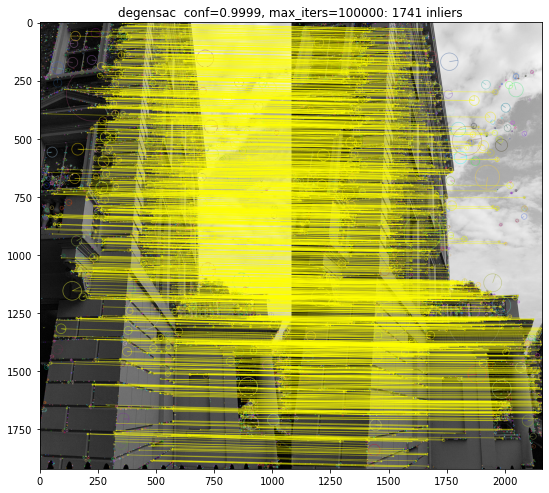

F:
 [[-8.49567980e-06  3.14057141e-04 -2.42764466e-01]
 [-3.25283117e-04 -4.81779402e-07 -9.89839612e-01]
 [ 2.34364091e-01  1.00000000e+00  2.27626009e+01]]
E:
 [[-1.97358680e+01  7.29569668e+02  8.25741486e+01]
 [-7.55648142e+02 -1.11919645e+00 -1.77822129e+03]
 [-1.25656120e+02  1.78080461e+03  1.92394771e+01]]
from E recovered R: 
 [[ 0.99951489  0.02837208 -0.01284588]
 [-0.02823433  0.99954319  0.01078076]
 [ 0.01314588 -0.01041284  0.99985937]]
errors (R, T): (0.009908873763823661, 0.5791953634650476)
scene=scene1


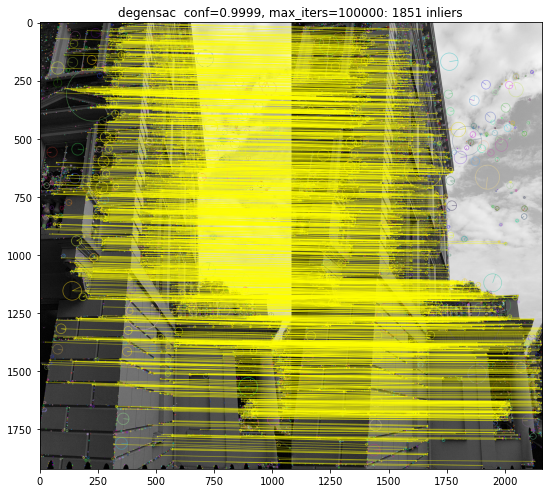

F:
 [[ 8.91780145e-06 -2.98406265e-04  3.69966402e-01]
 [ 2.95953436e-04  1.57414733e-05 -1.03393612e+00]
 [-4.07120565e-01  1.00000000e+00  5.11659970e+01]]
E:
 [[   20.71647667  -693.21193708   134.68639789]
 [  687.51389918    36.5681907  -1310.09248582]
 [ -180.0252983   1300.76226779    14.36030428]]
from E recovered R: 
 [[ 0.99955191  0.02973197 -0.00346224]
 [-0.02969103  0.9994949   0.01133079]
 [ 0.00379738 -0.01122291  0.99992981]]
errors (R, T): (0.0007031513283518368, 0.3073538477138337)
scene=scene1


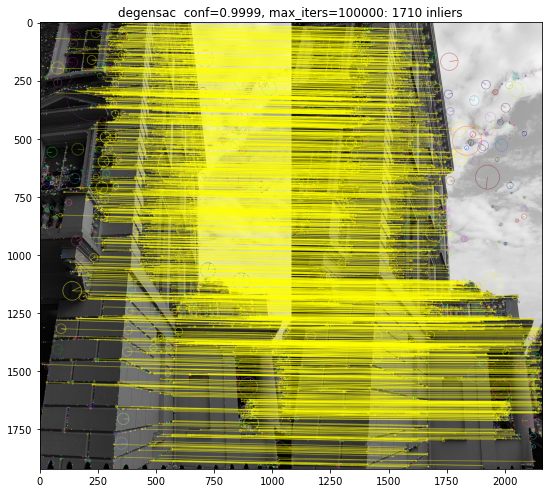

F:
 [[ 1.10625568e-05 -3.68729433e-04  4.52962018e-01]
 [ 3.67394094e-04  1.63082024e-05 -1.03683244e+00]
 [-4.94134347e-01  1.00000000e+00  5.43832765e+01]]
E:
 [[   25.69884539  -856.57599989   160.069798  ]
 [  853.47394265    37.88472927 -1254.84395365]
 [ -206.33472468  1243.7485791     14.35432164]]
from E recovered R: 
 [[ 0.99956104  0.02950402 -0.00269041]
 [-0.0294739   0.99950914  0.01061949]
 [ 0.0030024  -0.01053554  0.99993999]]
errors (R, T): (0.00045153595908824625, 0.41603509709617015)
All relative rotation errors: 0.00045153595908824625,
0.0007031513283518368,
0.0022564100424838046,
0.004826878176808458,
0.0065448635205548385,
0.007602276014666704,
0.009908873763823661,
0.012728950957449399,
3.1401883969396276,
3.1409094964235127


In [3]:
img_name1 = "frame_0000001610_4"
img_name2 = "frame_0000001580_4"

match(img_name1, img_name2, 10, degensac=True, precise=True, show=True)


scene=scene1


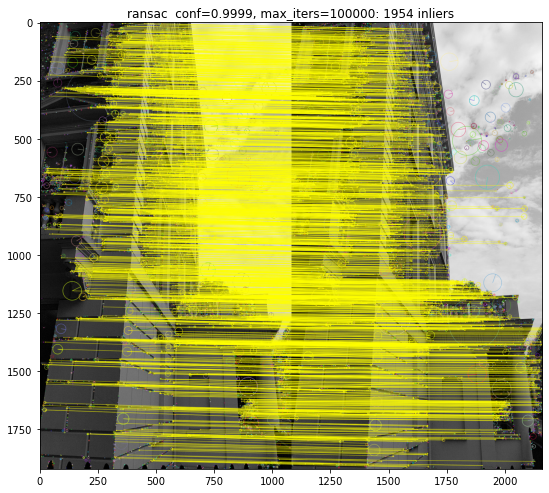

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
scene=scene1


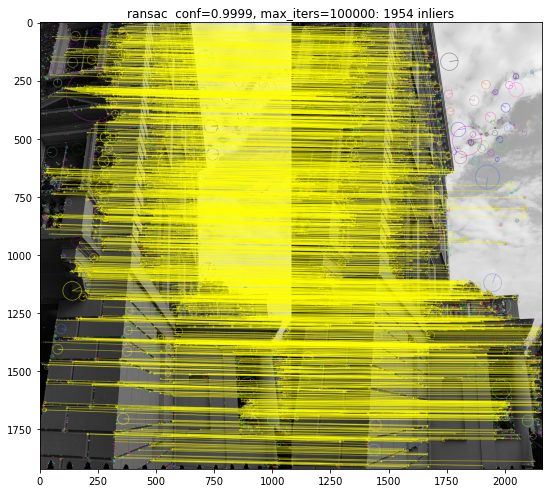

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
scene=scene1


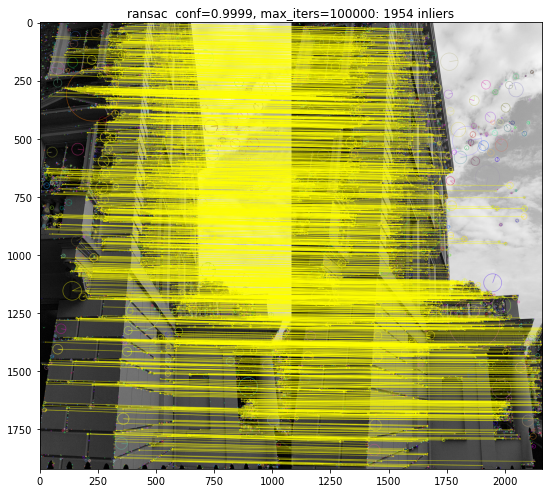

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
scene=scene1


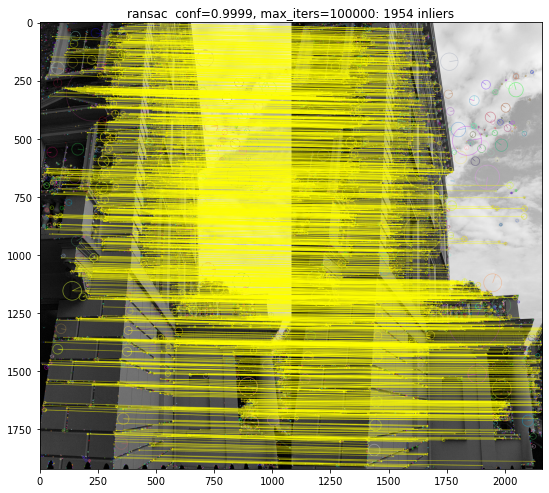

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
scene=scene1


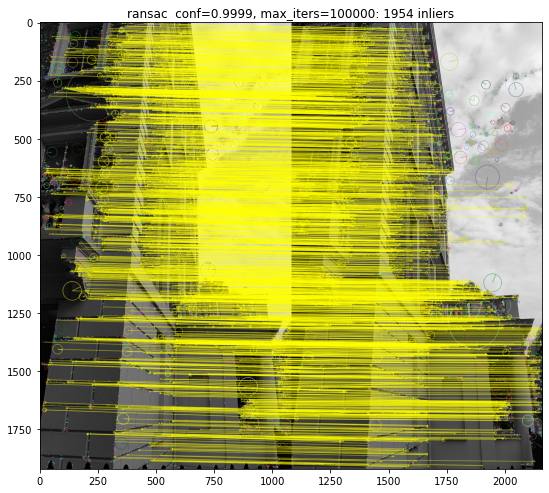

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
scene=scene1


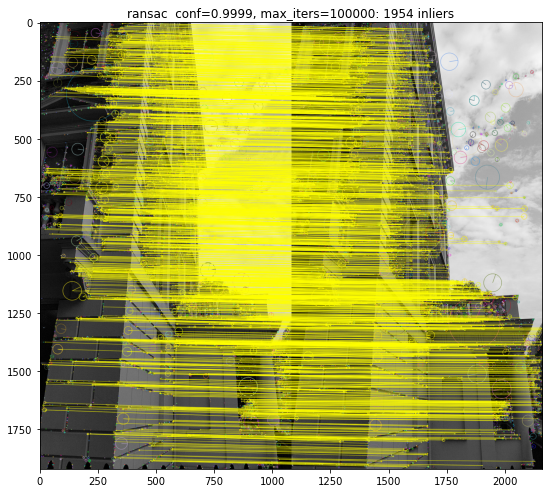

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
scene=scene1


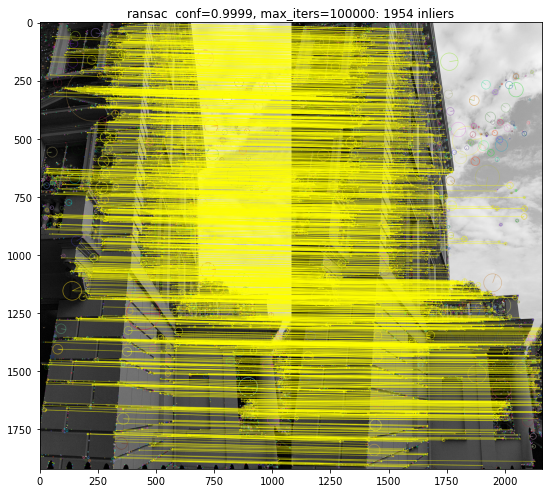

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
scene=scene1


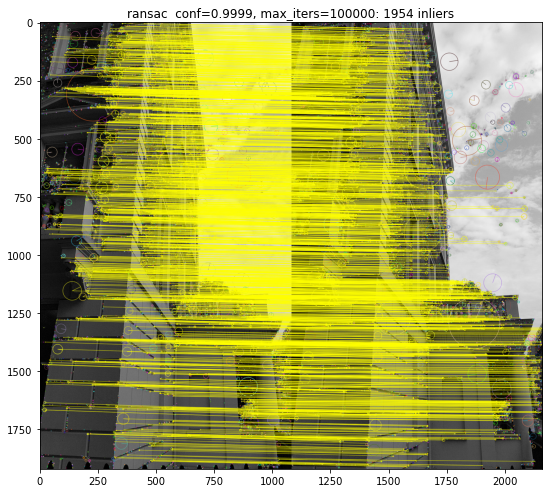

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
scene=scene1


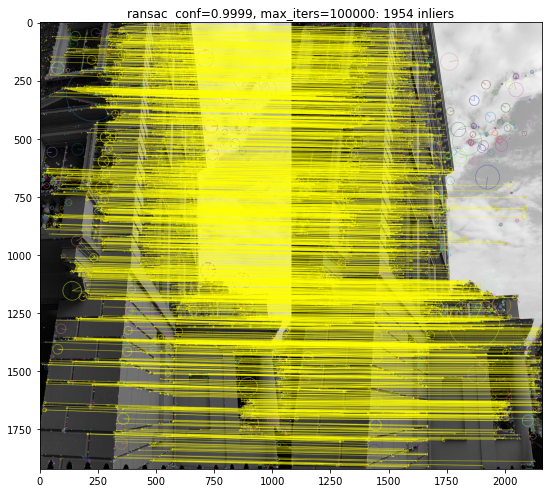

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
scene=scene1


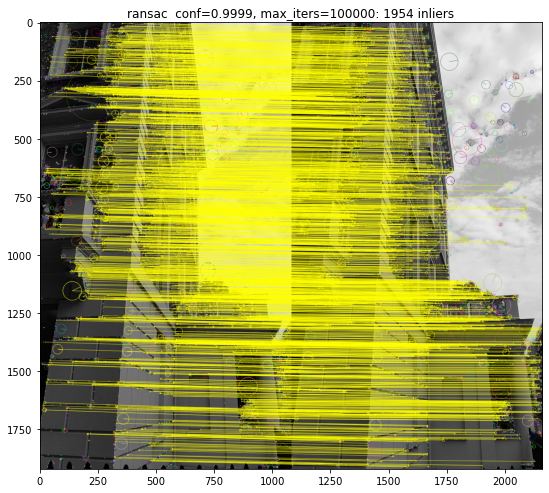

F:
 [[ 8.55313288e-09 -3.01675708e-07  3.18408333e-04]
 [ 2.97825656e-07  2.31211395e-08 -2.12693730e-03]
 [-3.83429870e-04  2.08206173e-03  8.75577302e-02]]
E:
 [[ 0.01986933 -0.70080701  0.05096699]
 [ 0.69186316  0.05371151 -2.96470388]
 [-0.14150214  2.95704969  0.03117222]]
from E recovered R: 
 [[ 0.99959633  0.02828165 -0.00270749]
 [-0.02825033  0.99954056  0.01098111]
 [ 0.00301681 -0.01090019  0.99993604]]
errors (R, T): (0.0011450815927421542, 0.1404073602638055)
All relative rotation errors: 0.0011450815927421542,
0.0011450815927421542,
0.0011450815927421542,
0.0011450815927421542,
0.0011450815927421542,
0.0011450815927421542,
0.0011450815927421542,
0.0011450815927421542,
0.0011450815927421542,
0.0011450815927421542


In [6]:
img_name1 = "frame_0000001610_4"
img_name2 = "frame_0000001580_4"

match(img_name1, img_name2, 10, degensac=False, precise=True, show=True)


In [5]:
img_name1 = "frame_0000001440_4"
img_name2 = "frame_0000000270_1"

match(img_name1, img_name2, 5, show=False)


scene=scene1
F:
 [[ 6.97625203e-05 -2.50010653e-03  3.84991047e+00]
 [ 2.40499755e-03  1.66583170e-04 -1.06348157e+00]
 [-4.09785971e+00  1.00000000e+00 -1.76921019e+02]]
E:
 [[  161.55807281 -5789.8194035   2262.5611427 ]
 [ 5569.5632408    385.7781483    601.03094977]
 [-2666.49174774  -289.48462629  -247.19462166]]
from E recovered R: 
 [[ 0.9936604   0.0668396   0.09039626]
 [-0.07347347  0.99468277  0.07216529]
 [-0.0850921  -0.07834952  0.99328782]]
errors (R, T): (0.010632706065879655, 0.021294369444544502)
scene=scene1
F:
 [[-8.52782293e-04 -1.48290588e-03  4.46221519e+00]
 [ 1.66937305e-03  1.19309290e-04 -1.39287526e+00]
 [-3.92474776e+00  1.00000000e+00 -1.02864031e+02]]
E:
 [[-1974.89802891 -3434.15654738  3921.50572018]
 [ 3865.98265736   276.29992332  -573.25612689]
 [-4236.58777012   477.71139119  -231.8431529 ]]
from E recovered R: 
 [[ 0.97892873 -0.04196519  0.19984359]
 [ 0.03565242  0.9987482   0.03508479]
 [-0.20106577 -0.02722061  0.97919947]]
errors (R, T): (0.16